In [35]:
from sklearn.datasets import fetch_openml
import pandas as pd

# Load MNIST dataset
mnist = fetch_openml('mnist_784')

# Create a DataFrame
data = pd.DataFrame(data=mnist.data, columns=mnist.feature_names)
data['target'] = mnist.target


C:\Users\lenovo\anaconda3\Lib\site-packages\sklearn\datasets\_openml.py:1002: FutureWarning:

The default value of `parser` will change from `'liac-arff'` to `'auto'` in 1.4. You can set `parser='auto'` to silence this warning. Therefore, an `ImportError` will be raised from 1.4 if the dataset is dense and pandas is not installed. Note that the pandas parser may return different data types. See the Notes Section in fetch_openml's API doc for details.



# Loaded MNIST data and Checked Description .

In [36]:
data

,pixel1,pixel2,pixel3,pixel4,pixel5,pixel6,pixel7,pixel8,pixel9,pixel10,...,pixel776,pixel777,pixel778,pixel779,pixel780,pixel781,pixel782,pixel783,pixel784,target
0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,5
1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0
2,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,4
3,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1
4,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,9
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
69995,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,2
69996,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,3
69997,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,4
69998,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,5


In [37]:
import pandas as pd 
import numpy as np
data.shape

(70000, 785)

In [38]:
data.sample()

,pixel1,pixel2,pixel3,pixel4,pixel5,pixel6,pixel7,pixel8,pixel9,pixel10,...,pixel776,pixel777,pixel778,pixel779,pixel780,pixel781,pixel782,pixel783,pixel784,target
20229,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,7


In [39]:
#converting data into numeric 
data = data.apply(pd.to_numeric)

Using Image show to verify that the sample observation which is selected is providing right "traget" or not.

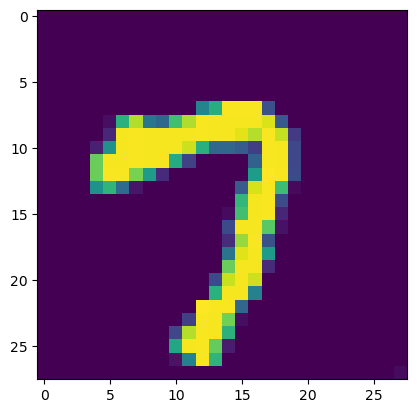

In [69]:
import matplotlib.pyplot as plt

#checking sample is giving correct value,row value can change according to value given by sample   
plt.imshow(data.iloc[20229,1:].values.reshape(28,28))

# Seperated Traget and Independent varaibles , Converted "Targets" into Binary Variable. 

In [41]:
# Features (pixel values)
X = data.drop(columns=['target'])  

# Target labels (digits)
y = data['target'].apply(lambda x: 0 if x <= 4 else 1)

# Splited Train and Test data, with 10000 observation into test data.

In [42]:
from sklearn.model_selection import train_test_split
X_train,X_test,y_train,y_test=train_test_split(X,y,test_size=1/7,random_state=42)

# Standardized data with StandardScaler Option.

In [43]:
from sklearn.preprocessing import StandardScaler

sc = StandardScaler()
X_train_std = sc.fit_transform(X_train)
X_test_std = sc.transform(X_test)

# Taken Overall PCA of 784 features for Check and Eigen values listed below.

In [44]:
from sklearn.decomposition import PCA
pca=PCA(n_components=None)
X_train_trf=pca.fit_transform(X_train)
X_test_trf =pca.transform(X_test)

In [45]:
import numpy as np
cov_mat = np.cov(X_train_std.T)
eigen_vals, eigen_vecs = np.linalg.eig(cov_mat)

print('\nEigenvalues \n%s' % eigen_vals)


Eigenvalues 
[ 4.05566220e+01  2.90128040e+01  2.69137551e+01  2.08402575e+01
  1.81236620e+01  1.57425734e+01  1.37375307e+01  1.25340263e+01
  1.09757578e+01  9.99880179e+00  9.67637402e+00  8.67001577e+00
  8.00368675e+00  7.87018533e+00  7.38777964e+00  7.16610916e+00
  6.71634605e+00  6.60928925e+00  6.39173051e+00  6.21487253e+00
  5.89436458e+00  5.75029083e+00  5.49604033e+00  5.34088499e+00
  5.14356934e+00  4.94245135e+00  4.87608940e+00  4.72418472e+00
  4.50426774e+00  4.38250110e+00  4.31163432e+00  4.23297593e+00
  4.06631127e+00  4.00099149e+00  3.97374174e+00  3.84450579e+00
  3.77747647e+00  3.72605351e+00  3.65697466e+00  3.45118982e+00
  3.42490570e+00  3.35090385e+00  3.27350888e+00  3.23371966e+00
  3.20611153e+00  3.14745821e+00  3.14292821e+00  3.08400641e+00
  3.04119933e+00  2.99633058e+00  2.93287375e+00  2.88280446e+00
  2.84392957e+00  2.81762156e+00  2.78027094e+00  2.68146675e+00
  2.65812854e+00  2.65458516e+00  2.58700198e+00  2.57139565e+00
  2.2506370

In [46]:
tot = sum(eigen_vals)
var_exp = [(i / tot) for i in sorted(eigen_vals, reverse=True)]
cum_var_exp = np.cumsum(var_exp)

# Graph below shows the maximum variance covering Features ,which equals 300

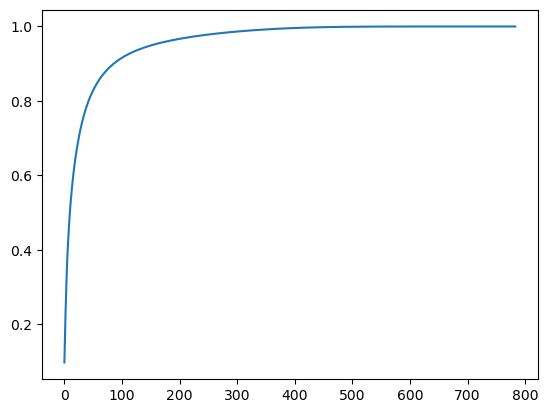

In [47]:
plt.plot(np.cumsum(pca.explained_variance_ratio_))

In [48]:
pca=PCA(n_components=300)
X_train_trf=pca.fit_transform(X_train)
X_test_trf =pca.transform(X_test)

PCA at 300 Features for further analysis.

In [49]:

# Compute the covariance matrix
cov_matrix = np.cov(X, rowvar=False)  # rowvar=False assumes columns as variables/features

# Calculate eigenvalues and eigenvectors
eigenvalues, eigenvectors = np.linalg.eig(cov_matrix)

# Display the eigenvalues
print("Eigenvalues:", eigenvalues)


Eigenvalues: [ 3.34294061e+05+0.00000000e+00j  2.45433427e+05+0.00000000e+00j
  2.10930355e+05+0.00000000e+00j  1.85337356e+05+0.00000000e+00j
  1.67691572e+05+0.00000000e+00j  1.47670297e+05+0.00000000e+00j
  1.12445139e+05+0.00000000e+00j  9.91153833e+04+0.00000000e+00j
  9.46125388e+04+0.00000000e+00j  8.03359569e+04+0.00000000e+00j
  7.22599113e+04+0.00000000e+00j  6.98885540e+04+0.00000000e+00j
  5.85527059e+04+0.00000000e+00j  5.81052758e+04+0.00000000e+00j
  5.43103821e+04+0.00000000e+00j  5.09819786e+04+0.00000000e+00j
  4.52543057e+04+0.00000000e+00j  4.38704888e+04+0.00000000e+00j
  4.07237248e+04+0.00000000e+00j  3.95459992e+04+0.00000000e+00j
  3.65654146e+04+0.00000000e+00j  3.46361826e+04+0.00000000e+00j
  3.28991121e+04+0.00000000e+00j  3.12006965e+04+0.00000000e+00j
  3.02969450e+04+0.00000000e+00j  2.87716612e+04+0.00000000e+00j
  2.77774204e+04+0.00000000e+00j  2.69503081e+04+0.00000000e+00j
  2.53911681e+04+0.00000000e+00j  2.36676475e+04+0.00000000e+00j
  2.21397823

In [50]:
np.cumsum(pca.explained_variance_ratio_)

array([0.09736019, 0.16898788, 0.23056067, 0.2846365 , 0.33357892,
       0.37672555, 0.40942105, 0.43828444, 0.4658365 , 0.48920004,
       0.5103419 , 0.53070349, 0.54780622, 0.5647821 , 0.58058063,
       0.59541091, 0.60856163, 0.62133961, 0.63322509, 0.64477152,
       0.65546705, 0.66557672, 0.67511774, 0.68419607, 0.6930222 ,
       0.70141217, 0.7095055 , 0.71735836, 0.72476445, 0.73165897,
       0.73823402, 0.74468296, 0.75069825, 0.75655912, 0.76224646,
       0.76767431, 0.77273037, 0.77760568, 0.78239574, 0.78706085,
       0.79160507, 0.79605883, 0.8002502 , 0.80421231, 0.80805346,
       0.81180878, 0.81542322, 0.81892676, 0.82230877, 0.82550391,
       0.82866977, 0.83176265, 0.83471523, 0.83758845, 0.84041052,
       0.84310508, 0.84577798, 0.84834263, 0.85087876, 0.85331754,
       0.85571456, 0.85809655, 0.86039452, 0.86260715, 0.8647335 ,
       0.86679305, 0.86881577, 0.87076143, 0.87268091, 0.87456908,
       0.87644037, 0.87824077, 0.88000374, 0.88173101, 0.88337

## Eigen Values and Cumulative explained variance Ratio together in one plot.

C:\Users\lenovo\anaconda3\Lib\site-packages\matplotlib\transforms.py:762: ComplexWarning:

Casting complex values to real discards the imaginary part

C:\Users\lenovo\anaconda3\Lib\site-packages\matplotlib\cbook\__init__.py:1335: ComplexWarning:

Casting complex values to real discards the imaginary part



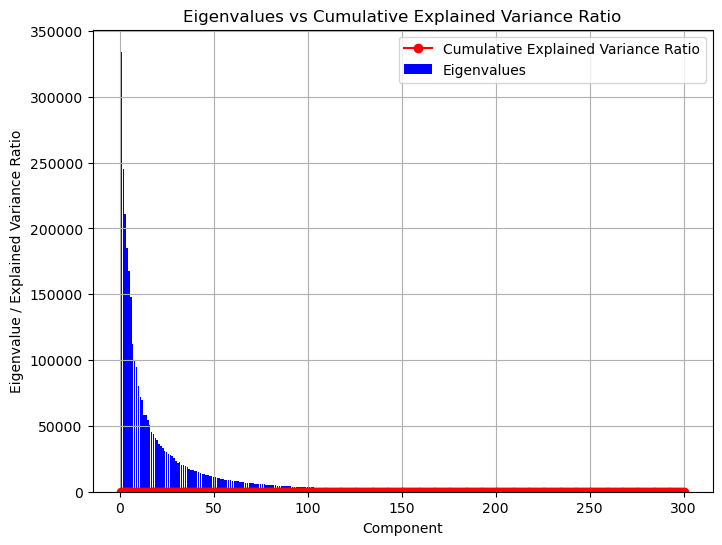

In [52]:
import numpy as np
import matplotlib.pyplot as plt

# Example eigenvalues
eigenvalues = eigenvalues
# Number of components to display
num_components = 300  # Change this value to plot different number of components

# Calculate explained variance ratio
explained_variance_ratio = eigenvalues / np.sum(eigenvalues)

# Calculate cumulative explained variance ratio
cumulative_variance_ratio = np.cumsum(explained_variance_ratio)

# Plot both eigenvalues and cumulative explained variance ratio
plt.figure(figsize=(8, 6))

# Plot eigenvalues
plt.bar(range(1, num_components + 1), eigenvalues[:num_components], label='Eigenvalues', color='b')

# Plot cumulative explained variance ratio
plt.plot(range(1, num_components + 1), cumulative_variance_ratio[:num_components], marker='o', color='r', label='Cumulative Explained Variance Ratio')

plt.xlabel('Component')
plt.ylabel('Eigenvalue / Explained Variance Ratio')
plt.title('Eigenvalues vs Cumulative Explained Variance Ratio')
plt.legend()
plt.grid(True)
plt.show()

## Used KnnClassifier for Binary Classification problem. 

In [53]:
from sklearn.neighbors import KNeighborsClassifier
knn=KNeighborsClassifier()
knn.fit(X_train_trf,y_train)

KNeighborsClassifier()

In [54]:
y_pred=knn.predict(X_test_trf)


In [55]:
X_test_trf

array([[ 7.21748553e+02, -3.99009737e+02, -3.24848869e+02, ...,
        -1.45754604e+00,  4.22213286e+01,  1.20709220e+01],
       [-2.41620792e+02,  6.67133684e+02, -3.41028323e+02, ...,
        -8.56620157e+00,  2.22647890e+01,  1.27665205e+01],
       [-6.60336662e+01, -9.45117510e+01, -5.22467121e+02, ...,
         2.61551546e+00,  1.46550811e+01, -8.33922502e+00],
       ...,
       [ 3.99087013e+02, -4.64081820e+02,  3.65683376e+02, ...,
        -2.50276685e+01,  2.41802436e+01, -6.12075229e+00],
       [ 1.39046292e+03, -3.90811550e+02,  5.50110324e+01, ...,
        -5.01389615e-02,  7.46557995e+00,  1.41355388e+01],
       [ 1.90275780e+02, -1.75485425e+02, -6.01304947e+02, ...,
        -9.47623400e+00,  7.20227891e+00, -3.18115060e+01]])

In [56]:
from sklearn.metrics import accuracy_score 
accuracy_score(y_test,y_pred)

0.9827

In [57]:
from sklearn.neighbors import KNeighborsClassifier
knn=KNeighborsClassifier()
knn.fit(X_train_trf,y_train)
y_pred = knn.predict_proba(X_test_trf)[:,1]

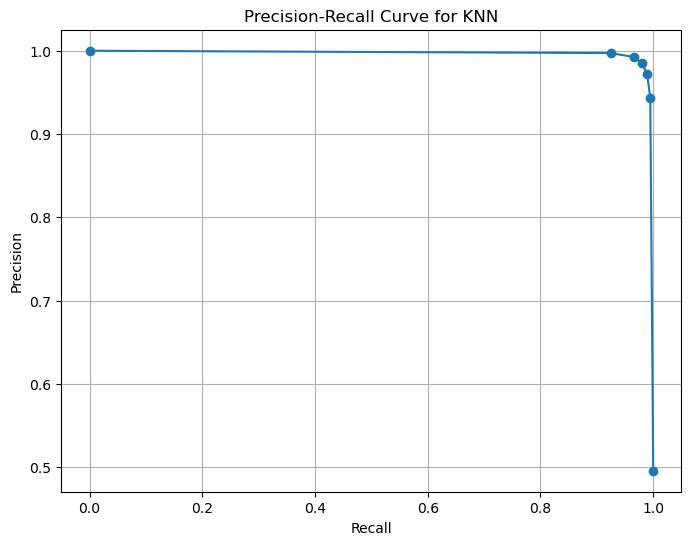

In [58]:
from sklearn.metrics import precision_recall_curve

# Calculate precision and recall
precision, recall, _ = precision_recall_curve(y_test, y_pred)

# Plot precision-recall curve
plt.figure(figsize=(8, 6))
plt.plot(recall, precision, marker='o')
plt.xlabel('Recall')
plt.ylabel('Precision')
plt.title('Precision-Recall Curve for KNN')
plt.grid(True)
plt.show()

In [59]:
y_pred

array([1. , 0. , 0.8, ..., 0. , 0.8, 0. ])

In [60]:
from sklearn.metrics import roc_curve

fpr, tpr, thresholds = roc_curve(y_test,y_pred)

In [61]:
thresholds

array([inf, 1. , 0.8, 0.6, 0.4, 0.2, 0. ])

## ROC Curve.

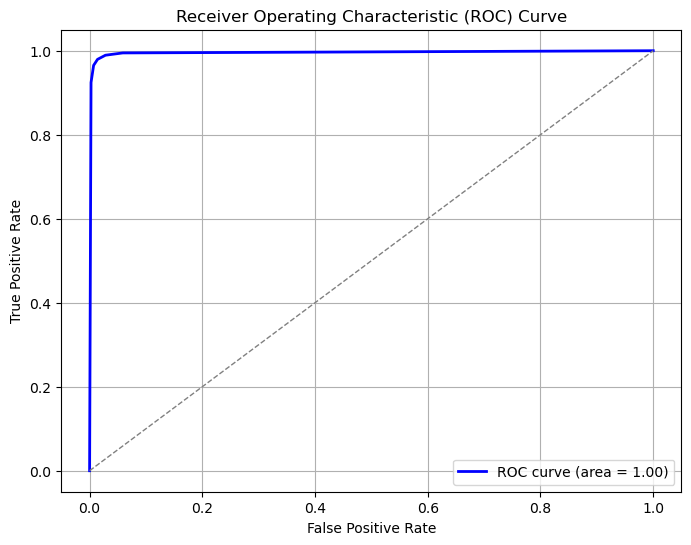

In [62]:
from sklearn.datasets import make_classification
from sklearn.model_selection import train_test_split
from sklearn.neighbors import KNeighborsClassifier
from sklearn.metrics import roc_curve, auc
import matplotlib.pyplot as plt



# Compute ROC curve and ROC area for each class
fpr, tpr, _ = roc_curve(y_test, y_pred)
roc_auc = auc(fpr, tpr)

# Plot ROC curve
plt.figure(figsize=(8, 6))
plt.plot(fpr, tpr, color='blue', lw=2, label='ROC curve (area = %0.2f)' % roc_auc)
plt.plot([0, 1], [0, 1], color='gray', lw=1, linestyle='--')  # Random guess line
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend(loc='lower right')
plt.grid(True)
plt.show()


In [63]:
pca=PCA(n_components=2)
X_train_trf=pca.fit_transform(X_train_trf)
X_test_trf =pca.transform(X_test_trf)

In [64]:
X_train_trf

array([[  859.87379369,    21.03554243],
       [ -416.53110032,   698.55952615],
       [  187.61827208,   -37.49599736],
       ...,
       [ -978.48140681,  -371.24132973],
       [ 1227.52937377,  -413.15088432],
       [  799.56467225, -1067.45115701]])

# Done PCA with 2 and 3 Feature for Visualization in 2D and 3D.

In [65]:
import plotly.express as px 
y_train_trf =y_train.astype(str)
fig = px.scatter(x=X_train_trf[:,0],y=X_train_trf[:,1],color=y_train_trf,color_discrete_sequence=px.colors.qualitative.G10)
fig.show()

In [66]:
pca=PCA(n_components=3)
X_train_trf=pca.fit_transform(X_train)
X_test_trf =pca.transform(X_test)

In [67]:
X_train_trf

array([[  859.87606284,    21.01799092,   817.61430149],
       [ -416.53131049,   698.56547914,   190.03658519],
       [  187.61560978,   -37.48125956,    95.92645115],
       ...,
       [ -978.48094441,  -371.23491808,    15.78870337],
       [ 1227.52743415,  -413.13529548,   763.23030898],
       [  799.56482173, -1067.45079757,   800.00575622]])

In [68]:
y_train_trf=y_train.astype(str)
fig=px.scatter_3d(data,x=X_train_trf[:,0],y=X_train_trf[:,1],z=X_train_trf[:,2],color=y_train_trf)
fig.update_layout(margin=dict(l=20,r=20,t=20,b=20))
fig.show()